In [1]:
import ROOT
import numpy as np
import matplotlib.pyplot as plt
#import sndisplay as sn
import uproot as uproot
import pandas as pd
from matplotlib import cycler, patches
from itertools import compress

Welcome to JupyROOT 6.22/00


In [38]:
from random import random

In [19]:
import uncertainties as unc  
import uncertainties.unumpy as unumpy
from uncertainties import unumpy

 - side or corner cells always starting earlier with precocious HV
(different field condition with neighbor cells being powered or not)

 - DATA vs current drift model implemented in Falaise ... not bad !
→ good starting point to build a data driven drift model RADIUS=f(R0)
Indication of tiny dependancy of anodic drift vs HV

In [3]:
RUN732 = ROOT.TFile.Open("snemo_run-732_red.root")

In [4]:
tree=RUN732.RED

In [6]:
n_events = tree.GetEntries()
print(f'Total number of events: {n_events}')

Total number of events: 61651


In [7]:
params = pd.read_csv('drift_parameters.csv',delimiter=' ')

In [8]:
cell_names = ["CTL850", "CTL880", "CTL910", "TLL850", "TLL880", "TLL910", "TLR850", "TLR880", "TLR910"]


In [9]:
params.set_axis(["CTL850", "CTL880", "CTL910", "TLL850", "TLL880", "TLL910", "TLR850", "TLR880", "TLR910"], inplace=True)# axis=0)

In [10]:
params

,a,erra,b,errb,a2,erra2,b2,errb2
CTL850,8.282263e-07,1.850337e-09,-0.907466,0.004641,4.019795e-07,2.435733e-08,-1.954948,0.062983
CTL880,8.561280e-07,2.036183e-09,-0.914130,0.004482,3.965750e-07,2.439756e-08,-1.988641,0.065016
CTL910,8.816780e-07,2.004627e-09,-0.917762,0.004462,4.522209e-07,2.375446e-08,-1.898359,0.054975
TLL850,7.667807e-07,1.144962e-09,-0.872313,0.003034,5.040766e-07,8.134947e-09,-1.425197,0.017012
TLL880,7.919723e-07,1.011822e-09,-0.867454,0.002451,4.936923e-07,1.003254e-08,-1.478953,0.021912
TLL910,8.165303e-07,1.083998e-09,-0.877313,0.002534,5.081597e-07,1.307598e-08,-1.480181,0.027430
TLR850,8.050174e-07,2.547660e-09,-0.896535,0.006233,3.341033e-07,1.580400e-08,-2.037198,0.049292
TLR880,8.352047e-07,2.460194e-09,-0.915948,0.005145,3.385664e-07,1.312296e-08,-2.066336,0.041354
TLR910,8.555671e-07,2.725064e-09,-0.894959,0.006623,3.346804e-07,1.431110e-08,-2.106005,0.045496


In [11]:
RUN732.ls()

TFile**		snemo_run-732_red.root	
 TFile*		snemo_run-732_red.root	
  OBJ: TTree	RED	SuperNEMO RED data : 0 at: 0x73a1c50
  KEY: TTree	RED;1	SuperNEMO RED data


In [12]:
tree = RUN732.RED

In [14]:
branches = tree.GetListOfBranches()

In [15]:
i=0
j=0
c_tdc2sec = 0.625E-08
t_tdc2sec = 1.25E-08
g=[]
MAX_GG_TIMES = 10
config=[]
for event in tree:
    run_id = event.run_id
    event_id = event.event_id
    nb_tracker_hits = event.nb_tracker_hits #                                     # int Number of t
    tracker_anode_R0_ticks = [list(event.tracker_anode_R0_ticks)[i*MAX_GG_TIMES:MAX_GG_TIMES*(i+1)] 
                              for i in range(nb_tracker_hits)]                 # list(int) Anode time LSB: 12.5 ns

    calo_ticks = list(event.calo_ticks)                                 # list(int) Calo TDC (6.25ns)
    HT_flag = list(event.calo_ht)
    calo_times=np.array(list(compress(calo_ticks, HT_flag)))
    tracker_cell_side_id = list(event.tracker_cell_side_id)                     # list(int) TR side (1: French, 0: Italian)
    tracker_cell_row_id = list(event.tracker_cell_row_id)                       # list(int) TR row (0-112)
    tracker_cell_layer_id = list(event.tracker_cell_layer_id)
    
    config = zip(tracker_cell_side_id,tracker_cell_row_id,tracker_cell_layer_id)# for i in range(nb_tracker_hits)]
    
    a = np.array(tracker_anode_R0_ticks)
    
    if len(a)==0:
        g.append(0)
        continue

    print('RUN',run_id,'EVENT',event_id)

    if len(calo_times)<1:
        print('**no ht flag**')
        g.append([event_id,'no ht flag'])
        continue
    elif len(calo_times)>1:
        print('**more than one ht flag**')
        print(calo_times)
        g.append([('event no. %s'%event_id), a[:,0]*t_tdc2sec - calo_times[0]*c_tdc2sec, 
             list(config)])
        

        j+=1
        continue
    elif len(tracker_anode_R0_ticks)<1:
        print('**no anode data**')
        g.append([event_id,'no anode data'])

        continue
    
    print(calo_times)
    print(a[:,0]*t_tdc2sec - calo_times*c_tdc2sec)
    g.append([('event no. %s'%event_id), a[:,0]*t_tdc2sec - calo_times*c_tdc2sec, 
             list(config)])
    i+=1
print(j)

RUN 732 EVENT 0
[2037672096]
[ 1.47500000e-06  8.49999999e-07  1.50000000e-07  5.26250000e-06
  1.13750000e-06 -1.62500001e-07  2.02500000e-06  1.24500000e-05
  7.37499999e-07  1.96250000e-06  3.07500000e-06  1.25000000e-07
 -5.00000006e-08  3.32500000e-06  1.18375000e-05 -1.15292150e+11
 -1.15292150e+11]
RUN 732 EVENT 1
**more than one ht flag**
[2040310190 2040310190 2040309554 2040309585]
RUN 732 EVENT 2
**more than one ht flag**
[2041287793 2041287793 2041287793]
RUN 732 EVENT 3
[2054864930]
[ 1.25000000e-07  7.87499999e-07  3.88750000e-06  8.75000001e-08
  6.99999999e-07  2.00000001e-07  9.99999994e-08  2.75000000e-07
  1.02500000e-06 -1.25000010e-08  3.87500000e-07  1.62499999e-07
  2.20000000e-06]
RUN 732 EVENT 4
**more than one ht flag**
[2066926033 2066925527]
RUN 732 EVENT 5
[2068897319]
[ 9.31250000e-07  2.40625000e-06  1.96875000e-06  3.18750001e-07
  6.24999963e-09 -8.12500005e-08  4.81250000e-07 -6.87499995e-08]
RUN 732 EVENT 6
**more than one ht flag**
[2070081674 207008

In [16]:
def invertfunc(t,a,b):
    
    """ A function that calculates distance from time"""
    power = (1/(1-b))
    
    return (t/a)**power

In [17]:
tfine=np.linspace(0,4e-6)
tfine2=np.linspace(4e-6,12e-6)

In [18]:
def plot_commissioning(event):
    title=str('event number ') + str(event)
    #params for ctl880 data
    popt1 = [8.56128044e-07, -9.14129862e-01] #r<2.2
    popt2 = [3.96575107e-07, -1.98864081e+00] #r>2.2

    #get times that are non negative
    j = g[event][1]>0
    
    plt.plot(CTL880.r,CTL880.t,'k.',label='simulated data',alpha=0.2)

    plt.plot(invertfunc(g[event][1][j][g[event][1][j]<4e-6],popt1[0],popt1[1]),g[event][1][j][g[event][1][j]<4e-6],'r.',label='com. data, r<2.2 params')
    plt.plot(invertfunc(g[event][1][j][g[event][1][j]>4e-6],popt2[0],popt2[1]),g[event][1][j][g[event][1][j]>4e-6],'c.',label=r'com. data, r$\geq$2.2 params')
    plt.legend()
    plt.xlabel('reconstructed radii (cm)')
    plt.ylabel('time (s)')
    plt.legend()
    plt.title(title)
    plt.show()
    print('no negatives:',sum(1 for i in g[event][1] if i < 0),', no fitted to r<2.2:',len(invertfunc(g[event][1][j][g[event][1][j]<4e-6],popt1[0],popt1[1])),', no fitted to r>2.2:',len(invertfunc(g[event][1][j][g[event][1][j]>4e-6],popt2[0],popt2[1])),', total:',len(g[event][1]))

In [20]:
##centre cells 880 #err 2 orders magnitude less than value
a, erra = 7.667e-07, 1.144e-09
b, errb = -0.872, 0.0036
a2, erra2 = 5.041e-07, 8.134e-09
b2, errb2 = -1.425, 0.017

In [21]:
def error_propagation(ts,a,erra,b,errb):
    errts = np.zeros(len(ts))
    t_tuple = unumpy.uarray(ts, errts)
    a_tuple = unumpy.uarray(a, erra)
    b_tuple = unumpy.uarray(b, errb)
    r = (t_tuple/a_tuple)**(1/(1-b_tuple))
    err = unumpy.std_devs(r)
    val = unumpy.nominal_values(r)
    return err, val

In [22]:
def fit_data(event):
    j = g[event][1]>0
    err,val = error_propagation(g[event][1][j],a,erra,b,errb)
    err2,val2 = error_propagation(g[event][1][j],a2,erra2,b2,errb2)
    return err, val, err2, val2

event = 364

j = g[event][1]>0
err, val, err2, val2 = fit_data(event)

In [23]:
import ROOT

def unpack(cell_region):
        xs = []
        ys = []
        ts = []
        errts = []
        for drift_times in cell_region.dtimes:
            xs.append(drift_times.xs)
            ys.append(drift_times.ys)
            ts.append(drift_times.dtime)
            errts.append(drift_times.errdtime)
        return xs, ys, ts, errts
    
class Cell:
    def __init__(self, region):
        unpacked_region = unpack(region)
        self.x = unpacked_region[0]
        self.y = unpacked_region[1]
        self.t = unpacked_region[2]
        self.errt = unpacked_region[3]
        self.r = np.sqrt(np.array(unpacked_region[0])**2 + np.array(unpacked_region[1])**2)
        

In [24]:
CTL880 = Cell(ROOT.TFile.Open("summaryCTL880.root"))

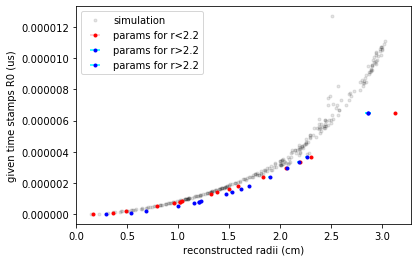

In [25]:
plt.plot(CTL880.r,CTL880.t,'k.',alpha=0.1,label='simulation')

plt.errorbar(val,g[event][1][j],xerr=err,fmt='.',ecolor = 'pink',color='red',label='params for r<2.2')
plt.errorbar(max(val2),max(g[event][1][j]),xerr=max(err2),fmt='.',ecolor = 'cyan',color='blue',label='params for r>2.2')
plt.errorbar(val2,g[event][1][j],xerr=err2,fmt='.',ecolor = 'cyan',color='blue',label='params for r>2.2')


plt.ylabel('given time stamps R0 (us)')
plt.xlabel('reconstructed radii (cm)')
plt.legend()

#error is so small it cant be seen , need to add errors for fitting to region

In [26]:
popt3 = [ 3.25747078e-07, -2.19108165e+00] #r>2.2
popt4 = [ 8.17794077e-07, -9.58955621e-01] #r<2.2

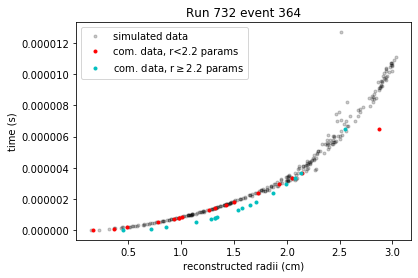

In [27]:

plt.plot(CTL880.r,CTL880.t,'k.',label='simulated data',alpha=0.2)

plt.plot(invertfunc(g[event][1][j],popt4[0],popt4[1]),g[event][1][j],'r.',label='com. data, r<2.2 params')
plt.plot(invertfunc(g[event][1][j],popt3[0],popt3[1]),g[event][1][j],'c.',label=r'com. data, r$\geq$2.2 params')
plt.legend()
plt.xlabel('reconstructed radii (cm)')
plt.ylabel('time (s)')
#plt.axvline(x=2.2,linestyle='dashed',color='gray',label='r=2.2')
plt.legend()
plt.title('Run 732 event 364')
plt.show()


In [28]:
#for ctl880 data
popt1 = [8.56128044e-07, -9.14129862e-01] #r<2.2
popt2 = [3.96575107e-07, -1.98864081e+00] #r>2.2

In [29]:
rs1 = np.sort(invertfunc(g[event][1][j],popt1[0],popt1[1]))
rs2 = np.sort(invertfunc(g[event][1][j],popt2[0],popt2[1]))

In [30]:
ts = np.sort(g[event][1][j])

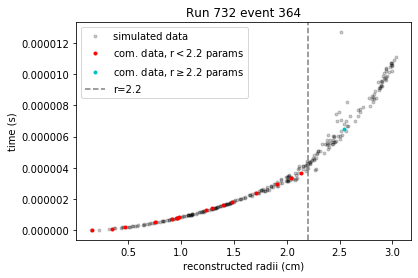

In [31]:
#plt.errorbar(val,g[event][1][j],xerr=err,fmt='.',ecolor = 'pink',color='pink',label='comissioning r<2.2')
#plt.errorbar(max(val2),max(g[event][1][j]),xerr=max(err2),fmt='.',ecolor = 'cyan',color='blue',label='comissioning for r>2.2')
#plt.errorbar(val2,g[event][1][j],xerr=err2,fmt='.',ecolor = 'cyan',color='blue',label='params for r>2.2')
plt.plot(CTL880.r,CTL880.t,'k.',label='simulated data',alpha=0.2)
plt.plot(rs1[:-1],ts[:-1],'r.',label=r'com. data, r$<2.2$ params')

plt.plot(max(rs2),max(ts),'c.',label=r'com. data, r$\geq2.2$ params')
plt.xlabel('reconstructed radii (cm)')
plt.ylabel('time (s)')
plt.axvline(x=2.2,linestyle='dashed',color='gray',label='r=2.2')
plt.legend()
plt.title('Run 732 event 364')
plt.show()

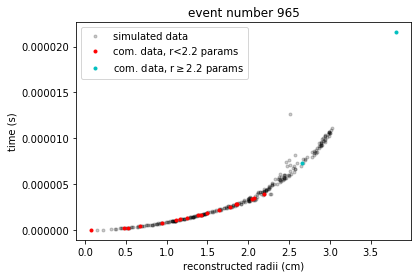

no negatives: 13 , no fitted to r<2.2: 18 , no fitted to r>2.2: 2 , total: 33


In [32]:
plot_commissioning(965)

In [36]:
j = g[965][1]>0
a = list(invertfunc(g[965][1][j][g[965][1][j]>=4e-6],popt2[0],popt2[1])) + list(invertfunc(g[965][1][j][g[965][1][j]<4e-6],popt1[0],popt1[1]))
newlist = [x if x <= np.sqrt(2*2.2**2) else 0 for x in a]

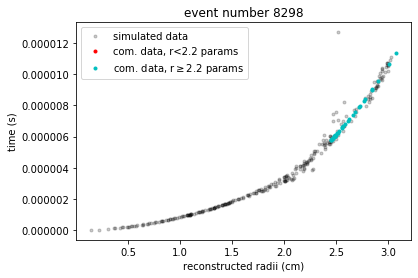

no negatives: 13 , no fitted to r<2.2: 0 , no fitted to r>2.2: 35 , total: 48


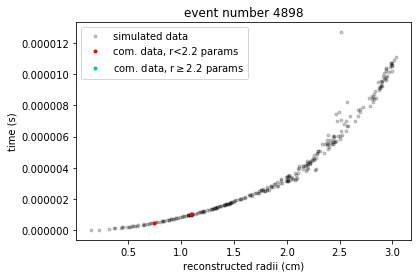

no negatives: 10 , no fitted to r<2.2: 2 , no fitted to r>2.2: 0 , total: 12


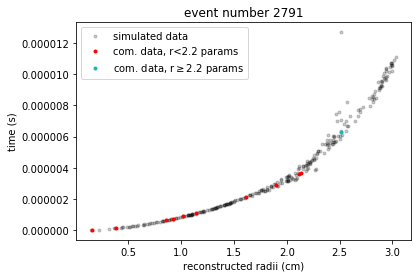

no negatives: 4 , no fitted to r<2.2: 10 , no fitted to r>2.2: 1 , total: 15


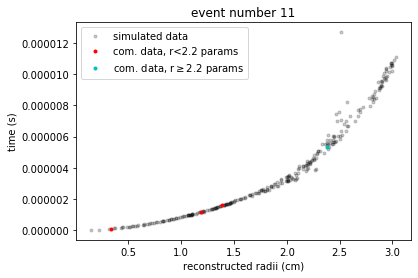

no negatives: 1 , no fitted to r<2.2: 3 , no fitted to r>2.2: 1 , total: 5


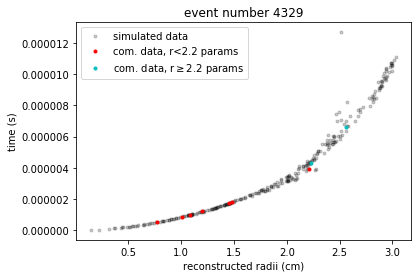

no negatives: 6 , no fitted to r<2.2: 7 , no fitted to r>2.2: 2 , total: 15


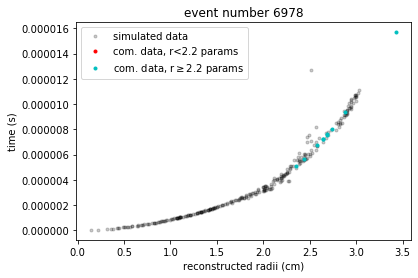

no negatives: 0 , no fitted to r<2.2: 0 , no fitted to r>2.2: 10 , total: 10


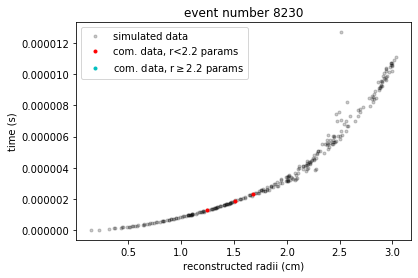

no negatives: 5 , no fitted to r<2.2: 3 , no fitted to r>2.2: 0 , total: 8


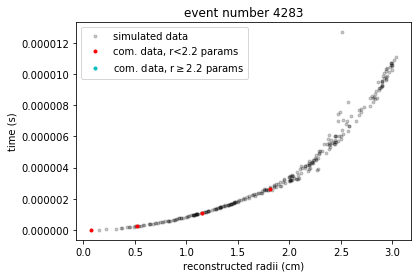

no negatives: 10 , no fitted to r<2.2: 4 , no fitted to r>2.2: 0 , total: 14


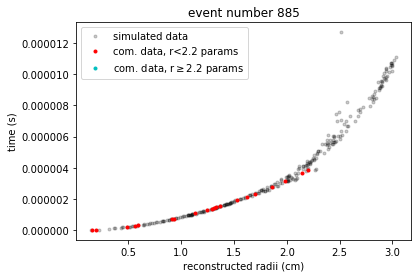

no negatives: 3 , no fitted to r<2.2: 20 , no fitted to r>2.2: 0 , total: 24


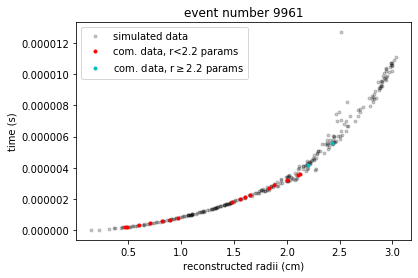

no negatives: 11 , no fitted to r<2.2: 16 , no fitted to r>2.2: 2 , total: 30


In [37]:
i=0
while i<10:
    plot_commissioning(np.random.randint(1,10000))
    i+=1